# trainGAN - generative art

## Introduction:

This mini-project on Generative art is trained by classical, renaissance paintings with the aid of deep learning and PyTorch to generate a myriad of visual generations that come with a sense of odd familiarity.

Generative Adversarial Network uses popular deep learning techniques such as convolutional neural networks to create appealing digital art, creating controversies in the creative community about the future of contemporary art and NFTs in the burgeoning new market.
The process entails automatically detecting and learning the regularities or patterns in the input data so that the model may be used to produce or output new examples that could have been drawn from the original dataset.

Generative modeling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset.

## Working: 

In GAN, there are two neural network models: Generator and Discriminator, competing against each other in a zero-sum game. 
The Generative modeling is an unsupervised learning problem, but a brilliant aspect of the GAN architecture is that the generative model's training is framed as a supervised learning problem. 

The generator is trained using a dataset to generate new examples and the discriminator model acts as a cop to deduce the integrity of the generated image as real or counterfeit. These two models are trained together and competed against each other until the Discriminator model is tricked around half of the time, indicating that the Generator model is producing credible results. 

In [3]:
import opendatasets as od

In [4]:
dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'

In [5]:
od.download(dataset_url)

Skipping, found downloaded files in ".\best-artworks-of-all-time" (use force=True to force download)


In [6]:
data_dir = r'D:\Workspace\Generative Art\best-artworks-of-all-time\resized'

In [7]:
import os

In [8]:
for cls in os.listdir(data_dir):
  print(cls, ':', len(os.listdir(data_dir + '/' + cls)))

resized : 8683


In [9]:
from torchvision.datasets import ImageFolder

In [10]:
dataset = ImageFolder(data_dir)

In [11]:
len(dataset)

8683

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline

# Sample images

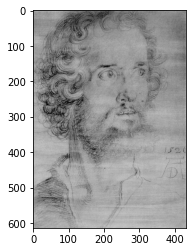

In [13]:
img, label = dataset[0]
plt.imshow(img)

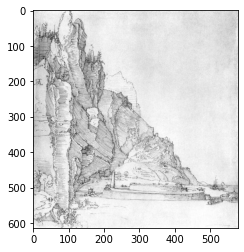

In [14]:
img, label = dataset[500]
plt.imshow(img)

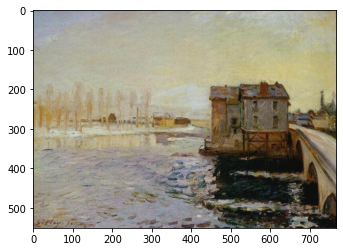

In [15]:
img, label = dataset[741]
plt.imshow(img)

# Making batches of picture

In [16]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [17]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [18]:
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [19]:
from torchvision.utils import make_grid

In [20]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [21]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

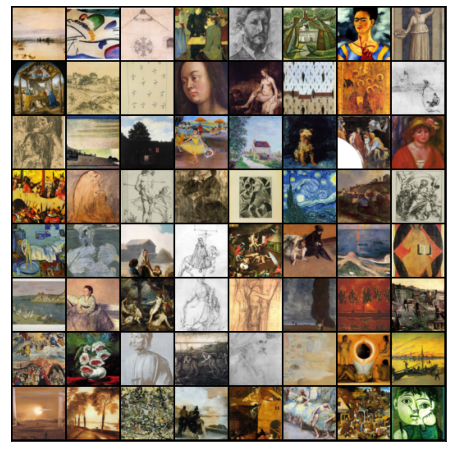

In [22]:
show_batch(train_dl)

# Using a GPU

In [23]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

In [24]:
import torch

In [25]:
device = get_default_device()
device

device(type='cuda')

In [26]:
train_dl = DeviceDataLoader(train_dl, device)

# Discriminator Network

The discriminator model inputs the image, and attempts to determine if it is real or counterfeit. We employ the convolutional neural network, a deep learning technique that produces a single number output for each image. Here, a stride of 2 is used to progressively reduce the size of the output feature map.

In [27]:
import torch.nn as nn

In [28]:
discriminator = nn.Sequential(
   

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
   

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    

    nn.Flatten(),
    nn.Sigmoid())

In [29]:
discriminator = to_device(discriminator, device)

# Generator Network

 A vector or a matrix of random numbers(latent tensor) which is typically used as a seed for generating an image is fed as the input to the generator. A latent tensor of shape (128, 1, 1) will be converted into an image tensor of shape (3 x 28 x 28) by the generator. This may be accomplished by using PyTorch's ConvTranspose2d layer, which acts as a transposed convolution (also referred to as a deconvolution)

In [30]:
latent_size = 128

In [31]:
generator = nn.Sequential(
    

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
   
)

# Sample generative image 

torch.Size([128, 3, 64, 64])


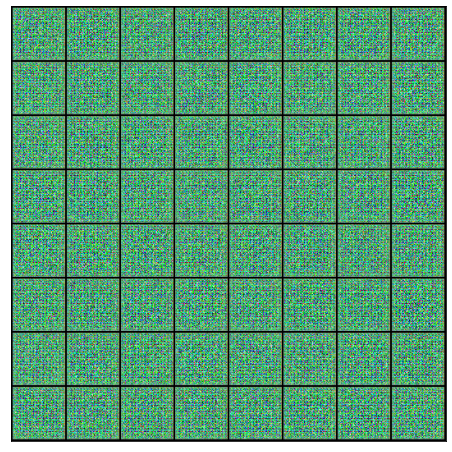

In [35]:
# random latent tensors

xb = torch.randn(batch_size, latent_size, 1, 1) 
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

Owing to the poor quality, the model needs to be train over and over again

In [36]:
generator = to_device(generator, device)

# Discriminator Training

In [3]:
def train_discriminator(real_images, opt_d):
    opt_d.zero_grad()
    
    # Pass real images
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

# Generator Training

In [4]:
def train_generator(opt_g):
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [39]:
from torchvision.utils import save_image

In [40]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [41]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [42]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


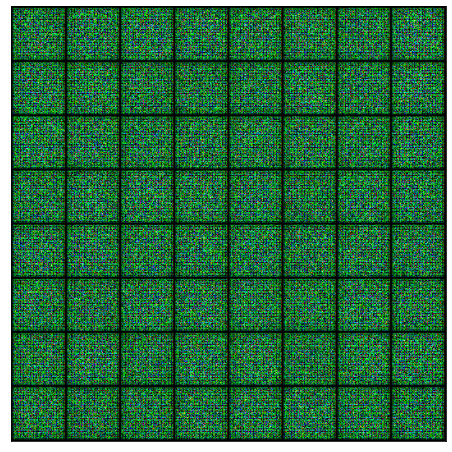

In [43]:
save_samples(0, fixed_latent)


## Full Training Loop

In [45]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [48]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [49]:
lr = 0.0002
epochs = 300

In [51]:
history = fit(epochs, lr)

  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [1/300], loss_g: 7.6689, loss_d: 0.0878, real_score: 0.9335, fake_score: 0.0170
Saving generated-images-0001.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [2/300], loss_g: 2.2730, loss_d: 0.7719, real_score: 0.9348, fake_score: 0.4306
Saving generated-images-0002.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [3/300], loss_g: 2.8895, loss_d: 0.7880, real_score: 0.7268, fake_score: 0.3140
Saving generated-images-0003.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [4/300], loss_g: 2.9209, loss_d: 0.6983, real_score: 0.7616, fake_score: 0.3129
Saving generated-images-0004.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [5/300], loss_g: 4.4124, loss_d: 0.4213, real_score: 0.9372, fake_score: 0.2847
Saving generated-images-0005.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [6/300], loss_g: 3.6409, loss_d: 0.3582, real_score: 0.8347, fake_score: 0.1377
Saving generated-images-0006.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [7/300], loss_g: 3.9314, loss_d: 1.2056, real_score: 0.7482, fake_score: 0.5312
Saving generated-images-0007.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [8/300], loss_g: 2.9147, loss_d: 0.6768, real_score: 0.6766, fake_score: 0.2080
Saving generated-images-0008.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [9/300], loss_g: 3.5637, loss_d: 0.5165, real_score: 0.8099, fake_score: 0.2339
Saving generated-images-0009.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [10/300], loss_g: 2.6394, loss_d: 0.3374, real_score: 0.8116, fake_score: 0.1071
Saving generated-images-0010.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [11/300], loss_g: 2.7020, loss_d: 0.3272, real_score: 0.7952, fake_score: 0.0748
Saving generated-images-0011.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [12/300], loss_g: 3.0725, loss_d: 0.4184, real_score: 0.7647, fake_score: 0.1157
Saving generated-images-0012.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [13/300], loss_g: 3.1679, loss_d: 0.5527, real_score: 0.7047, fake_score: 0.1160
Saving generated-images-0013.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [14/300], loss_g: 2.8930, loss_d: 0.4554, real_score: 0.7185, fake_score: 0.0772
Saving generated-images-0014.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [15/300], loss_g: 5.2999, loss_d: 0.6578, real_score: 0.8600, fake_score: 0.3384
Saving generated-images-0015.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [16/300], loss_g: 4.1715, loss_d: 0.5404, real_score: 0.8629, fake_score: 0.2959
Saving generated-images-0016.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [17/300], loss_g: 1.8881, loss_d: 0.9632, real_score: 0.5077, fake_score: 0.1026
Saving generated-images-0017.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [18/300], loss_g: 4.1537, loss_d: 0.7462, real_score: 0.7678, fake_score: 0.3363
Saving generated-images-0018.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [19/300], loss_g: 3.3790, loss_d: 0.4475, real_score: 0.8214, fake_score: 0.1972
Saving generated-images-0019.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [20/300], loss_g: 3.9068, loss_d: 0.5367, real_score: 0.8341, fake_score: 0.2669
Saving generated-images-0020.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [21/300], loss_g: 2.5289, loss_d: 0.4486, real_score: 0.8987, fake_score: 0.2547
Saving generated-images-0021.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [22/300], loss_g: 6.0401, loss_d: 1.1025, real_score: 0.8927, fake_score: 0.5781
Saving generated-images-0022.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [23/300], loss_g: 4.8463, loss_d: 0.7062, real_score: 0.8853, fake_score: 0.3872
Saving generated-images-0023.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [24/300], loss_g: 5.1279, loss_d: 0.5192, real_score: 0.9376, fake_score: 0.3418
Saving generated-images-0024.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [25/300], loss_g: 4.4672, loss_d: 0.4835, real_score: 0.9355, fake_score: 0.3136
Saving generated-images-0025.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [26/300], loss_g: 2.1605, loss_d: 0.7033, real_score: 0.5980, fake_score: 0.0707
Saving generated-images-0026.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [27/300], loss_g: 1.9839, loss_d: 1.2475, real_score: 0.3933, fake_score: 0.1418
Saving generated-images-0027.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [28/300], loss_g: 4.1212, loss_d: 0.6316, real_score: 0.5904, fake_score: 0.0107
Saving generated-images-0028.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [29/300], loss_g: 4.2178, loss_d: 0.4590, real_score: 0.9114, fake_score: 0.2768
Saving generated-images-0029.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [30/300], loss_g: 5.3324, loss_d: 0.6473, real_score: 0.8240, fake_score: 0.3180
Saving generated-images-0030.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [31/300], loss_g: 5.0040, loss_d: 0.6971, real_score: 0.8295, fake_score: 0.3575
Saving generated-images-0031.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [32/300], loss_g: 3.1304, loss_d: 0.5439, real_score: 0.6308, fake_score: 0.0233
Saving generated-images-0032.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [33/300], loss_g: 2.3784, loss_d: 0.5432, real_score: 0.6625, fake_score: 0.0760
Saving generated-images-0033.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [34/300], loss_g: 5.9213, loss_d: 0.8328, real_score: 0.9164, fake_score: 0.4787
Saving generated-images-0034.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [35/300], loss_g: 3.5936, loss_d: 0.2650, real_score: 0.8775, fake_score: 0.1069
Saving generated-images-0035.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [36/300], loss_g: 1.9914, loss_d: 0.6516, real_score: 0.6093, fake_score: 0.0844
Saving generated-images-0036.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [37/300], loss_g: 2.3463, loss_d: 0.4935, real_score: 0.7191, fake_score: 0.1063
Saving generated-images-0037.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [38/300], loss_g: 3.1779, loss_d: 0.5286, real_score: 0.6440, fake_score: 0.0318
Saving generated-images-0038.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [39/300], loss_g: 6.0711, loss_d: 0.6936, real_score: 0.8947, fake_score: 0.3992
Saving generated-images-0039.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [40/300], loss_g: 1.8166, loss_d: 0.5984, real_score: 0.6471, fake_score: 0.0975
Saving generated-images-0040.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [41/300], loss_g: 4.2575, loss_d: 0.6175, real_score: 0.8401, fake_score: 0.3159
Saving generated-images-0041.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [42/300], loss_g: 4.5405, loss_d: 0.3570, real_score: 0.9245, fake_score: 0.2286
Saving generated-images-0042.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [43/300], loss_g: 3.4466, loss_d: 0.3655, real_score: 0.7597, fake_score: 0.0480
Saving generated-images-0043.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [44/300], loss_g: 3.3695, loss_d: 0.3042, real_score: 0.8536, fake_score: 0.1205
Saving generated-images-0044.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [45/300], loss_g: 3.7951, loss_d: 0.3949, real_score: 0.8728, fake_score: 0.2043
Saving generated-images-0045.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [46/300], loss_g: 1.7599, loss_d: 0.5552, real_score: 0.6375, fake_score: 0.0436
Saving generated-images-0046.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [47/300], loss_g: 3.5161, loss_d: 0.3480, real_score: 0.7444, fake_score: 0.0248
Saving generated-images-0047.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [48/300], loss_g: 3.2955, loss_d: 0.2421, real_score: 0.8953, fake_score: 0.1142
Saving generated-images-0048.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [49/300], loss_g: 3.8037, loss_d: 0.3074, real_score: 0.9283, fake_score: 0.1884
Saving generated-images-0049.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [50/300], loss_g: 2.0259, loss_d: 0.2354, real_score: 0.8599, fake_score: 0.0703
Saving generated-images-0050.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [51/300], loss_g: 3.1665, loss_d: 0.3757, real_score: 0.8758, fake_score: 0.1911
Saving generated-images-0051.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [52/300], loss_g: 2.9678, loss_d: 0.2531, real_score: 0.8309, fake_score: 0.0490
Saving generated-images-0052.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [53/300], loss_g: 7.2630, loss_d: 1.0162, real_score: 0.9821, fake_score: 0.5503
Saving generated-images-0053.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [54/300], loss_g: 3.3947, loss_d: 0.3659, real_score: 0.8209, fake_score: 0.1403
Saving generated-images-0054.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [55/300], loss_g: 4.3221, loss_d: 0.4768, real_score: 0.8898, fake_score: 0.2732
Saving generated-images-0055.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [56/300], loss_g: 1.6588, loss_d: 0.1756, real_score: 0.8985, fake_score: 0.0586
Saving generated-images-0056.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [57/300], loss_g: 4.1544, loss_d: 0.4046, real_score: 0.9782, fake_score: 0.2866
Saving generated-images-0057.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [58/300], loss_g: 4.2117, loss_d: 0.1850, real_score: 0.9606, fake_score: 0.1264
Saving generated-images-0058.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [59/300], loss_g: 2.7688, loss_d: 0.2410, real_score: 0.9189, fake_score: 0.1324
Saving generated-images-0059.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [60/300], loss_g: 5.1971, loss_d: 0.1939, real_score: 0.9324, fake_score: 0.1082
Saving generated-images-0060.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [61/300], loss_g: 5.6928, loss_d: 0.2870, real_score: 0.9793, fake_score: 0.2099
Saving generated-images-0061.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [62/300], loss_g: 3.2971, loss_d: 0.2312, real_score: 0.8465, fake_score: 0.0482
Saving generated-images-0062.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [63/300], loss_g: 4.2423, loss_d: 0.2379, real_score: 0.9001, fake_score: 0.1132
Saving generated-images-0063.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [64/300], loss_g: 3.4868, loss_d: 0.1614, real_score: 0.8974, fake_score: 0.0418
Saving generated-images-0064.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [65/300], loss_g: 0.8814, loss_d: 0.6464, real_score: 0.6130, fake_score: 0.0646
Saving generated-images-0065.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [66/300], loss_g: 1.8997, loss_d: 0.2192, real_score: 0.8526, fake_score: 0.0462
Saving generated-images-0066.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [67/300], loss_g: 3.7949, loss_d: 0.1554, real_score: 0.9593, fake_score: 0.1007
Saving generated-images-0067.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [68/300], loss_g: 2.4742, loss_d: 1.0677, real_score: 0.4000, fake_score: 0.0014
Saving generated-images-0068.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [69/300], loss_g: 1.6832, loss_d: 0.4970, real_score: 0.7012, fake_score: 0.0632
Saving generated-images-0069.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [70/300], loss_g: 2.4527, loss_d: 0.2484, real_score: 0.8523, fake_score: 0.0712
Saving generated-images-0070.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [71/300], loss_g: 4.3509, loss_d: 0.2101, real_score: 0.8869, fake_score: 0.0767
Saving generated-images-0071.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [72/300], loss_g: 5.4509, loss_d: 0.3195, real_score: 0.7574, fake_score: 0.0070
Saving generated-images-0072.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [73/300], loss_g: 3.5566, loss_d: 0.5377, real_score: 0.9134, fake_score: 0.3236
Saving generated-images-0073.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [74/300], loss_g: 4.9182, loss_d: 0.1875, real_score: 0.9711, fake_score: 0.1371
Saving generated-images-0074.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [75/300], loss_g: 2.0332, loss_d: 0.2888, real_score: 0.8066, fake_score: 0.0512
Saving generated-images-0075.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [76/300], loss_g: 4.2971, loss_d: 0.1630, real_score: 0.9168, fake_score: 0.0675
Saving generated-images-0076.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [77/300], loss_g: 3.2094, loss_d: 0.3461, real_score: 0.7800, fake_score: 0.0574
Saving generated-images-0077.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [78/300], loss_g: 7.5128, loss_d: 1.1614, real_score: 0.9932, fake_score: 0.6009
Saving generated-images-0078.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [79/300], loss_g: 4.6618, loss_d: 0.1400, real_score: 0.9007, fake_score: 0.0299
Saving generated-images-0079.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [80/300], loss_g: 2.6736, loss_d: 0.2897, real_score: 0.8574, fake_score: 0.1081
Saving generated-images-0080.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [81/300], loss_g: 2.7839, loss_d: 0.2569, real_score: 0.8239, fake_score: 0.0441
Saving generated-images-0081.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [82/300], loss_g: 4.7955, loss_d: 0.3040, real_score: 0.8284, fake_score: 0.0687
Saving generated-images-0082.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [83/300], loss_g: 4.3745, loss_d: 0.1742, real_score: 0.9485, fake_score: 0.1061
Saving generated-images-0083.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [84/300], loss_g: 3.2818, loss_d: 0.0792, real_score: 0.9409, fake_score: 0.0153
Saving generated-images-0084.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [85/300], loss_g: 2.9604, loss_d: 0.2446, real_score: 0.8222, fake_score: 0.0302
Saving generated-images-0085.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [86/300], loss_g: 5.9528, loss_d: 0.3031, real_score: 0.9783, fake_score: 0.2101
Saving generated-images-0086.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [87/300], loss_g: 4.3543, loss_d: 0.3263, real_score: 0.9551, fake_score: 0.2228
Saving generated-images-0087.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [88/300], loss_g: 0.6576, loss_d: 0.8866, real_score: 0.5252, fake_score: 0.0291
Saving generated-images-0088.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [89/300], loss_g: 4.3141, loss_d: 0.1858, real_score: 0.8797, fake_score: 0.0463
Saving generated-images-0089.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [90/300], loss_g: 2.6896, loss_d: 0.3869, real_score: 0.7291, fake_score: 0.0305
Saving generated-images-0090.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [91/300], loss_g: 3.4543, loss_d: 0.1923, real_score: 0.9558, fake_score: 0.1277
Saving generated-images-0091.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [92/300], loss_g: 4.8379, loss_d: 0.2503, real_score: 0.9878, fake_score: 0.1912
Saving generated-images-0092.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [93/300], loss_g: 4.3457, loss_d: 0.2364, real_score: 0.9822, fake_score: 0.1777
Saving generated-images-0093.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [94/300], loss_g: 2.9491, loss_d: 0.3727, real_score: 0.7537, fake_score: 0.0273
Saving generated-images-0094.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [95/300], loss_g: 3.4173, loss_d: 0.3031, real_score: 0.7742, fake_score: 0.0146
Saving generated-images-0095.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [96/300], loss_g: 2.9702, loss_d: 0.1722, real_score: 0.9034, fake_score: 0.0620
Saving generated-images-0096.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [97/300], loss_g: 6.9592, loss_d: 1.2797, real_score: 0.9880, fake_score: 0.6107
Saving generated-images-0097.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [98/300], loss_g: 2.7690, loss_d: 0.3847, real_score: 0.7417, fake_score: 0.0253
Saving generated-images-0098.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [99/300], loss_g: 3.3762, loss_d: 0.1661, real_score: 0.9952, fake_score: 0.1390
Saving generated-images-0099.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [100/300], loss_g: 4.4418, loss_d: 0.1147, real_score: 0.9265, fake_score: 0.0343
Saving generated-images-0100.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [101/300], loss_g: 2.5828, loss_d: 0.2074, real_score: 0.8454, fake_score: 0.0269
Saving generated-images-0101.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [102/300], loss_g: 2.6767, loss_d: 0.2741, real_score: 0.9245, fake_score: 0.1548
Saving generated-images-0102.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [103/300], loss_g: 2.9474, loss_d: 0.5379, real_score: 0.6353, fake_score: 0.0136
Saving generated-images-0103.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [104/300], loss_g: 4.9360, loss_d: 0.1103, real_score: 0.9629, fake_score: 0.0669
Saving generated-images-0104.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [105/300], loss_g: 4.8057, loss_d: 0.1290, real_score: 0.9056, fake_score: 0.0246
Saving generated-images-0105.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [106/300], loss_g: 4.8059, loss_d: 0.1481, real_score: 0.9915, fake_score: 0.1231
Saving generated-images-0106.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [107/300], loss_g: 3.8470, loss_d: 0.2323, real_score: 0.9406, fake_score: 0.1289
Saving generated-images-0107.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [108/300], loss_g: 3.8181, loss_d: 0.3638, real_score: 0.9394, fake_score: 0.2260
Saving generated-images-0108.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [109/300], loss_g: 3.4927, loss_d: 0.1232, real_score: 0.9240, fake_score: 0.0395
Saving generated-images-0109.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [110/300], loss_g: 4.9743, loss_d: 0.1140, real_score: 0.9793, fake_score: 0.0634
Saving generated-images-0110.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [111/300], loss_g: 1.8270, loss_d: 0.3978, real_score: 0.8058, fake_score: 0.0998
Saving generated-images-0111.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [112/300], loss_g: 3.6848, loss_d: 0.2390, real_score: 0.9269, fake_score: 0.1333
Saving generated-images-0112.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [113/300], loss_g: 2.3606, loss_d: 0.3018, real_score: 0.7897, fake_score: 0.0363
Saving generated-images-0113.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [114/300], loss_g: 3.9501, loss_d: 0.2696, real_score: 0.8883, fake_score: 0.1236
Saving generated-images-0114.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [115/300], loss_g: 3.5827, loss_d: 0.2438, real_score: 0.8092, fake_score: 0.0132
Saving generated-images-0115.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [116/300], loss_g: 5.0073, loss_d: 0.0991, real_score: 0.9834, fake_score: 0.0749
Saving generated-images-0116.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [117/300], loss_g: 3.7716, loss_d: 0.1705, real_score: 0.8761, fake_score: 0.0298
Saving generated-images-0117.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [118/300], loss_g: 2.9106, loss_d: 0.1844, real_score: 0.9544, fake_score: 0.1164
Saving generated-images-0118.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [119/300], loss_g: 5.1393, loss_d: 0.3678, real_score: 0.9285, fake_score: 0.2203
Saving generated-images-0119.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [120/300], loss_g: 3.9021, loss_d: 0.1230, real_score: 0.9923, fake_score: 0.1026
Saving generated-images-0120.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [121/300], loss_g: 0.8530, loss_d: 0.6683, real_score: 0.5649, fake_score: 0.0055
Saving generated-images-0121.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [122/300], loss_g: 8.2545, loss_d: 1.1393, real_score: 0.9958, fake_score: 0.6032
Saving generated-images-0122.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [123/300], loss_g: 4.1461, loss_d: 0.1815, real_score: 0.8673, fake_score: 0.0252
Saving generated-images-0123.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [124/300], loss_g: 2.6763, loss_d: 0.2328, real_score: 0.8462, fake_score: 0.0453
Saving generated-images-0124.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [125/300], loss_g: 0.6508, loss_d: 0.8442, real_score: 0.4926, fake_score: 0.0164
Saving generated-images-0125.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [126/300], loss_g: 3.9682, loss_d: 0.3830, real_score: 0.7765, fake_score: 0.0322
Saving generated-images-0126.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [127/300], loss_g: 3.8822, loss_d: 0.0695, real_score: 0.9930, fake_score: 0.0579
Saving generated-images-0127.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [128/300], loss_g: 4.9183, loss_d: 0.2325, real_score: 0.9491, fake_score: 0.1371
Saving generated-images-0128.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [129/300], loss_g: 3.8526, loss_d: 0.1108, real_score: 0.9577, fake_score: 0.0615
Saving generated-images-0129.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [130/300], loss_g: 3.7480, loss_d: 0.1412, real_score: 0.8932, fake_score: 0.0211
Saving generated-images-0130.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [131/300], loss_g: 7.8480, loss_d: 0.7010, real_score: 0.9250, fake_score: 0.3534
Saving generated-images-0131.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [132/300], loss_g: 3.8222, loss_d: 0.1616, real_score: 0.9902, fake_score: 0.1203
Saving generated-images-0132.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [133/300], loss_g: 4.6904, loss_d: 0.0682, real_score: 0.9694, fake_score: 0.0351
Saving generated-images-0133.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [134/300], loss_g: 3.7184, loss_d: 0.1205, real_score: 0.9365, fake_score: 0.0498
Saving generated-images-0134.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [135/300], loss_g: 2.0547, loss_d: 0.2474, real_score: 0.8246, fake_score: 0.0398
Saving generated-images-0135.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [136/300], loss_g: 4.5880, loss_d: 0.4251, real_score: 0.8082, fake_score: 0.1235
Saving generated-images-0136.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [137/300], loss_g: 4.0010, loss_d: 0.2087, real_score: 0.9664, fake_score: 0.1443
Saving generated-images-0137.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [138/300], loss_g: 4.2545, loss_d: 0.0918, real_score: 0.9899, fake_score: 0.0756
Saving generated-images-0138.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [139/300], loss_g: 3.7658, loss_d: 0.0774, real_score: 0.9806, fake_score: 0.0536
Saving generated-images-0139.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [140/300], loss_g: 4.3024, loss_d: 0.0942, real_score: 0.9505, fake_score: 0.0405
Saving generated-images-0140.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [141/300], loss_g: 3.6301, loss_d: 0.1524, real_score: 0.9119, fake_score: 0.0429
Saving generated-images-0141.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [142/300], loss_g: 3.1497, loss_d: 0.1664, real_score: 0.8731, fake_score: 0.0225
Saving generated-images-0142.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [143/300], loss_g: 5.6946, loss_d: 0.0500, real_score: 0.9698, fake_score: 0.0182
Saving generated-images-0143.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [144/300], loss_g: 0.7459, loss_d: 0.2633, real_score: 0.8229, fake_score: 0.0407
Saving generated-images-0144.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [145/300], loss_g: 4.2102, loss_d: 0.1888, real_score: 0.8919, fake_score: 0.0529
Saving generated-images-0145.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [146/300], loss_g: 5.0090, loss_d: 0.0700, real_score: 0.9652, fake_score: 0.0321
Saving generated-images-0146.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [147/300], loss_g: 2.4802, loss_d: 0.2012, real_score: 0.8521, fake_score: 0.0250
Saving generated-images-0147.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [148/300], loss_g: 4.6000, loss_d: 0.0946, real_score: 0.9791, fake_score: 0.0680
Saving generated-images-0148.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [149/300], loss_g: 5.0076, loss_d: 0.0376, real_score: 0.9922, fake_score: 0.0285
Saving generated-images-0149.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [150/300], loss_g: 6.5324, loss_d: 0.4667, real_score: 0.9806, fake_score: 0.2975
Saving generated-images-0150.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [151/300], loss_g: 4.0413, loss_d: 0.2671, real_score: 0.8951, fake_score: 0.1103
Saving generated-images-0151.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [152/300], loss_g: 3.5303, loss_d: 0.1668, real_score: 0.8772, fake_score: 0.0241
Saving generated-images-0152.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [153/300], loss_g: 4.1018, loss_d: 0.1164, real_score: 0.9629, fake_score: 0.0692
Saving generated-images-0153.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [154/300], loss_g: 4.5942, loss_d: 0.0395, real_score: 0.9928, fake_score: 0.0311
Saving generated-images-0154.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [155/300], loss_g: 8.0690, loss_d: 0.7123, real_score: 0.9995, fake_score: 0.4142
Saving generated-images-0155.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [156/300], loss_g: 4.0170, loss_d: 0.0346, real_score: 0.9913, fake_score: 0.0249
Saving generated-images-0156.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [157/300], loss_g: 5.3536, loss_d: 0.0567, real_score: 0.9596, fake_score: 0.0139
Saving generated-images-0157.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [158/300], loss_g: 4.3969, loss_d: 0.0693, real_score: 0.9624, fake_score: 0.0287
Saving generated-images-0158.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [159/300], loss_g: 2.3789, loss_d: 0.2155, real_score: 0.8261, fake_score: 0.0079
Saving generated-images-0159.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [160/300], loss_g: 3.7137, loss_d: 1.8810, real_score: 0.8424, fake_score: 0.6604
Saving generated-images-0160.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [161/300], loss_g: 4.5907, loss_d: 0.4073, real_score: 0.7471, fake_score: 0.0497
Saving generated-images-0161.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [162/300], loss_g: 5.1951, loss_d: 0.1324, real_score: 0.9272, fake_score: 0.0456
Saving generated-images-0162.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [163/300], loss_g: 3.3660, loss_d: 0.1264, real_score: 0.9492, fake_score: 0.0658
Saving generated-images-0163.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [164/300], loss_g: 4.9011, loss_d: 0.1579, real_score: 0.9385, fake_score: 0.0794
Saving generated-images-0164.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [165/300], loss_g: 4.2989, loss_d: 0.0683, real_score: 0.9859, fake_score: 0.0498
Saving generated-images-0165.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [166/300], loss_g: 5.2431, loss_d: 0.1722, real_score: 0.9545, fake_score: 0.1076
Saving generated-images-0166.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [167/300], loss_g: 5.1242, loss_d: 0.0916, real_score: 0.9282, fake_score: 0.0149
Saving generated-images-0167.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [168/300], loss_g: 4.8862, loss_d: 0.3293, real_score: 0.9396, fake_score: 0.1757
Saving generated-images-0168.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [169/300], loss_g: 4.2459, loss_d: 0.0833, real_score: 0.9665, fake_score: 0.0435
Saving generated-images-0169.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [170/300], loss_g: 4.5086, loss_d: 0.1921, real_score: 0.9956, fake_score: 0.1526
Saving generated-images-0170.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [171/300], loss_g: 4.7949, loss_d: 0.0508, real_score: 0.9756, fake_score: 0.0247
Saving generated-images-0171.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [172/300], loss_g: 4.6391, loss_d: 0.0946, real_score: 0.9381, fake_score: 0.0284
Saving generated-images-0172.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [173/300], loss_g: 3.0873, loss_d: 0.1831, real_score: 0.8564, fake_score: 0.0147
Saving generated-images-0173.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [174/300], loss_g: 4.1364, loss_d: 0.0918, real_score: 0.9401, fake_score: 0.0268
Saving generated-images-0174.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [175/300], loss_g: 4.2927, loss_d: 0.2640, real_score: 0.8229, fake_score: 0.0325
Saving generated-images-0175.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [176/300], loss_g: 2.9030, loss_d: 0.3079, real_score: 0.7862, fake_score: 0.0136
Saving generated-images-0176.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [177/300], loss_g: 2.9495, loss_d: 0.3003, real_score: 0.7815, fake_score: 0.0034
Saving generated-images-0177.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [178/300], loss_g: 5.3754, loss_d: 0.0327, real_score: 0.9872, fake_score: 0.0193
Saving generated-images-0178.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [179/300], loss_g: 3.8911, loss_d: 0.1460, real_score: 0.9561, fake_score: 0.0864
Saving generated-images-0179.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [180/300], loss_g: 5.7208, loss_d: 0.1730, real_score: 0.9671, fake_score: 0.1064
Saving generated-images-0180.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [181/300], loss_g: 4.5456, loss_d: 0.0970, real_score: 0.9397, fake_score: 0.0304
Saving generated-images-0181.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [182/300], loss_g: 5.6444, loss_d: 0.0917, real_score: 0.9936, fake_score: 0.0783
Saving generated-images-0182.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [183/300], loss_g: 5.5499, loss_d: 0.0174, real_score: 0.9965, fake_score: 0.0135
Saving generated-images-0183.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [184/300], loss_g: 3.8638, loss_d: 0.0846, real_score: 0.9807, fake_score: 0.0575
Saving generated-images-0184.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [185/300], loss_g: 6.0420, loss_d: 0.0213, real_score: 0.9899, fake_score: 0.0109
Saving generated-images-0185.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [186/300], loss_g: 4.2981, loss_d: 0.0690, real_score: 0.9809, fake_score: 0.0470
Saving generated-images-0186.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [187/300], loss_g: 4.8919, loss_d: 0.1431, real_score: 0.9334, fake_score: 0.0607
Saving generated-images-0187.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [188/300], loss_g: 4.5016, loss_d: 0.0254, real_score: 0.9993, fake_score: 0.0240
Saving generated-images-0188.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [189/300], loss_g: 3.4550, loss_d: 0.0504, real_score: 0.9800, fake_score: 0.0281
Saving generated-images-0189.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [190/300], loss_g: 5.6176, loss_d: 0.1066, real_score: 0.9940, fake_score: 0.0781
Saving generated-images-0190.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [191/300], loss_g: 6.7238, loss_d: 0.0771, real_score: 0.9832, fake_score: 0.0561
Saving generated-images-0191.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [192/300], loss_g: 1.4023, loss_d: 2.4806, real_score: 0.5917, fake_score: 0.4869
Saving generated-images-0192.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [193/300], loss_g: 1.8754, loss_d: 1.2693, real_score: 0.6361, fake_score: 0.4598
Saving generated-images-0193.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [194/300], loss_g: 3.9841, loss_d: 0.7583, real_score: 0.8104, fake_score: 0.2658
Saving generated-images-0194.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [195/300], loss_g: 2.8976, loss_d: 0.6793, real_score: 0.6129, fake_score: 0.0467
Saving generated-images-0195.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [196/300], loss_g: 5.0511, loss_d: 0.0730, real_score: 0.9801, fake_score: 0.0483
Saving generated-images-0196.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [197/300], loss_g: 3.1670, loss_d: 0.3635, real_score: 0.8321, fake_score: 0.1336
Saving generated-images-0197.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [198/300], loss_g: 4.0943, loss_d: 0.1121, real_score: 0.9848, fake_score: 0.0854
Saving generated-images-0198.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [199/300], loss_g: 4.1910, loss_d: 0.0403, real_score: 0.9928, fake_score: 0.0317
Saving generated-images-0199.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [200/300], loss_g: 5.2574, loss_d: 0.1188, real_score: 0.9209, fake_score: 0.0236
Saving generated-images-0200.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [201/300], loss_g: 4.3220, loss_d: 0.0955, real_score: 0.9249, fake_score: 0.0137
Saving generated-images-0201.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [202/300], loss_g: 5.3351, loss_d: 0.0528, real_score: 0.9620, fake_score: 0.0130
Saving generated-images-0202.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [203/300], loss_g: 7.1576, loss_d: 0.1401, real_score: 0.8758, fake_score: 0.0016
Saving generated-images-0203.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [204/300], loss_g: 3.4285, loss_d: 0.1448, real_score: 0.8883, fake_score: 0.0190
Saving generated-images-0204.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [205/300], loss_g: 6.0094, loss_d: 0.0185, real_score: 0.9923, fake_score: 0.0105
Saving generated-images-0205.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [206/300], loss_g: 4.6436, loss_d: 0.0617, real_score: 0.9625, fake_score: 0.0216
Saving generated-images-0206.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [207/300], loss_g: 3.2205, loss_d: 0.1486, real_score: 0.8836, fake_score: 0.0144
Saving generated-images-0207.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [208/300], loss_g: 5.0800, loss_d: 0.1269, real_score: 0.9986, fake_score: 0.1111
Saving generated-images-0208.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [209/300], loss_g: 1.5592, loss_d: 1.0758, real_score: 0.5884, fake_score: 0.3054
Saving generated-images-0209.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [210/300], loss_g: 1.9118, loss_d: 0.4370, real_score: 0.7212, fake_score: 0.0454
Saving generated-images-0210.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [211/300], loss_g: 3.8082, loss_d: 0.1905, real_score: 0.9319, fake_score: 0.1015
Saving generated-images-0211.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [212/300], loss_g: 6.1949, loss_d: 0.0258, real_score: 0.9992, fake_score: 0.0236
Saving generated-images-0212.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [213/300], loss_g: 4.8666, loss_d: 0.0816, real_score: 0.9788, fake_score: 0.0559
Saving generated-images-0213.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [214/300], loss_g: 6.0759, loss_d: 0.1934, real_score: 0.9896, fake_score: 0.1520
Saving generated-images-0214.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [215/300], loss_g: 3.9028, loss_d: 0.1037, real_score: 0.9908, fake_score: 0.0846
Saving generated-images-0215.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [216/300], loss_g: 4.9220, loss_d: 0.0936, real_score: 0.9346, fake_score: 0.0228
Saving generated-images-0216.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [217/300], loss_g: 4.1225, loss_d: 0.0659, real_score: 0.9970, fake_score: 0.0568
Saving generated-images-0217.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [218/300], loss_g: 5.1178, loss_d: 0.6437, real_score: 0.9762, fake_score: 0.3645
Saving generated-images-0218.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [219/300], loss_g: 4.2619, loss_d: 0.0683, real_score: 0.9558, fake_score: 0.0209
Saving generated-images-0219.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [220/300], loss_g: 4.3708, loss_d: 0.1105, real_score: 0.9110, fake_score: 0.0118
Saving generated-images-0220.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [221/300], loss_g: 5.3457, loss_d: 0.1500, real_score: 0.9625, fake_score: 0.0967
Saving generated-images-0221.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [222/300], loss_g: 5.0860, loss_d: 0.0468, real_score: 0.9872, fake_score: 0.0323
Saving generated-images-0222.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [223/300], loss_g: 7.6087, loss_d: 0.0986, real_score: 0.9325, fake_score: 0.0153
Saving generated-images-0223.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [224/300], loss_g: 5.6080, loss_d: 0.0863, real_score: 0.9300, fake_score: 0.0100
Saving generated-images-0224.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [225/300], loss_g: 4.9356, loss_d: 0.0349, real_score: 0.9866, fake_score: 0.0206
Saving generated-images-0225.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [226/300], loss_g: 4.5581, loss_d: 0.0682, real_score: 0.9461, fake_score: 0.0111
Saving generated-images-0226.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [227/300], loss_g: 5.5424, loss_d: 0.0273, real_score: 0.9869, fake_score: 0.0137
Saving generated-images-0227.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [228/300], loss_g: 5.8909, loss_d: 0.0414, real_score: 0.9931, fake_score: 0.0331
Saving generated-images-0228.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [229/300], loss_g: 5.8623, loss_d: 0.0394, real_score: 0.9985, fake_score: 0.0362
Saving generated-images-0229.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [230/300], loss_g: 4.9177, loss_d: 0.0336, real_score: 0.9956, fake_score: 0.0281
Saving generated-images-0230.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [231/300], loss_g: 3.7703, loss_d: 0.1630, real_score: 0.9009, fake_score: 0.0445
Saving generated-images-0231.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [232/300], loss_g: 5.3275, loss_d: 0.0643, real_score: 0.9863, fake_score: 0.0460
Saving generated-images-0232.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [233/300], loss_g: 5.4224, loss_d: 0.0369, real_score: 0.9733, fake_score: 0.0090
Saving generated-images-0233.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [234/300], loss_g: 5.3056, loss_d: 0.0681, real_score: 0.9964, fake_score: 0.0591
Saving generated-images-0234.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [235/300], loss_g: 4.8099, loss_d: 0.0583, real_score: 0.9918, fake_score: 0.0472
Saving generated-images-0235.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [236/300], loss_g: 5.9685, loss_d: 0.0253, real_score: 0.9969, fake_score: 0.0215
Saving generated-images-0236.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [237/300], loss_g: 9.0980, loss_d: 1.0900, real_score: 0.9999, fake_score: 0.5211
Saving generated-images-0237.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [238/300], loss_g: 5.9495, loss_d: 0.0268, real_score: 0.9933, fake_score: 0.0194
Saving generated-images-0238.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [239/300], loss_g: 5.7429, loss_d: 0.0309, real_score: 0.9791, fake_score: 0.0092
Saving generated-images-0239.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [240/300], loss_g: 5.5111, loss_d: 0.0520, real_score: 0.9903, fake_score: 0.0399
Saving generated-images-0240.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [241/300], loss_g: 5.6472, loss_d: 0.0103, real_score: 0.9993, fake_score: 0.0095
Saving generated-images-0241.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [242/300], loss_g: 5.6860, loss_d: 0.0259, real_score: 0.9789, fake_score: 0.0044
Saving generated-images-0242.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [243/300], loss_g: 5.6178, loss_d: 0.0235, real_score: 0.9854, fake_score: 0.0085
Saving generated-images-0243.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [244/300], loss_g: 6.1486, loss_d: 0.0224, real_score: 0.9833, fake_score: 0.0055
Saving generated-images-0244.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [245/300], loss_g: 5.3408, loss_d: 0.0328, real_score: 0.9954, fake_score: 0.0267
Saving generated-images-0245.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [246/300], loss_g: 1.5996, loss_d: 1.6018, real_score: 0.5719, fake_score: 0.4583
Saving generated-images-0246.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [247/300], loss_g: 2.5296, loss_d: 0.8866, real_score: 0.5490, fake_score: 0.0638
Saving generated-images-0247.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [248/300], loss_g: 4.9195, loss_d: 0.2683, real_score: 0.9315, fake_score: 0.1474
Saving generated-images-0248.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [249/300], loss_g: 5.3826, loss_d: 0.0866, real_score: 0.9438, fake_score: 0.0242
Saving generated-images-0249.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [250/300], loss_g: 3.7278, loss_d: 0.2246, real_score: 0.9357, fake_score: 0.1222
Saving generated-images-0250.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [251/300], loss_g: 4.0572, loss_d: 0.0795, real_score: 0.9502, fake_score: 0.0231
Saving generated-images-0251.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [252/300], loss_g: 4.4665, loss_d: 0.0519, real_score: 0.9966, fake_score: 0.0450
Saving generated-images-0252.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [253/300], loss_g: 2.4292, loss_d: 0.2226, real_score: 0.8558, fake_score: 0.0460
Saving generated-images-0253.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [254/300], loss_g: 5.2312, loss_d: 0.0394, real_score: 0.9870, fake_score: 0.0252
Saving generated-images-0254.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [255/300], loss_g: 3.9419, loss_d: 0.1037, real_score: 0.9298, fake_score: 0.0246
Saving generated-images-0255.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [256/300], loss_g: 6.3211, loss_d: 0.0768, real_score: 0.9460, fake_score: 0.0177
Saving generated-images-0256.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [257/300], loss_g: 4.9227, loss_d: 0.1096, real_score: 0.9455, fake_score: 0.0455
Saving generated-images-0257.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [258/300], loss_g: 5.9001, loss_d: 0.0239, real_score: 0.9958, fake_score: 0.0191
Saving generated-images-0258.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [259/300], loss_g: 3.5095, loss_d: 0.2186, real_score: 0.8289, fake_score: 0.0094
Saving generated-images-0259.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [260/300], loss_g: 5.2354, loss_d: 0.0412, real_score: 0.9978, fake_score: 0.0364
Saving generated-images-0260.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [261/300], loss_g: 5.4494, loss_d: 0.0349, real_score: 0.9899, fake_score: 0.0238
Saving generated-images-0261.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [262/300], loss_g: 5.5755, loss_d: 0.1178, real_score: 0.9873, fake_score: 0.0940
Saving generated-images-0262.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [263/300], loss_g: 6.0646, loss_d: 0.0168, real_score: 0.9976, fake_score: 0.0142
Saving generated-images-0263.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [264/300], loss_g: 5.0315, loss_d: 0.0544, real_score: 0.9874, fake_score: 0.0388
Saving generated-images-0264.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [265/300], loss_g: 5.7383, loss_d: 0.0880, real_score: 0.9638, fake_score: 0.0409
Saving generated-images-0265.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [266/300], loss_g: 5.0303, loss_d: 0.0475, real_score: 0.9829, fake_score: 0.0283
Saving generated-images-0266.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [267/300], loss_g: 5.5175, loss_d: 0.0428, real_score: 0.9970, fake_score: 0.0368
Saving generated-images-0267.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [268/300], loss_g: 5.7845, loss_d: 0.0399, real_score: 0.9770, fake_score: 0.0159
Saving generated-images-0268.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [269/300], loss_g: 4.5838, loss_d: 0.0472, real_score: 0.9996, fake_score: 0.0440
Saving generated-images-0269.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [270/300], loss_g: 6.0988, loss_d: 0.0441, real_score: 0.9651, fake_score: 0.0073
Saving generated-images-0270.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [271/300], loss_g: 6.1098, loss_d: 0.0845, real_score: 0.9261, fake_score: 0.0037
Saving generated-images-0271.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [272/300], loss_g: 5.8059, loss_d: 0.0247, real_score: 0.9853, fake_score: 0.0097
Saving generated-images-0272.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [273/300], loss_g: 2.4051, loss_d: 0.1636, real_score: 0.8646, fake_score: 0.0083
Saving generated-images-0273.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [274/300], loss_g: 5.6602, loss_d: 0.0207, real_score: 0.9993, fake_score: 0.0194
Saving generated-images-0274.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [275/300], loss_g: 3.3553, loss_d: 0.1525, real_score: 0.8730, fake_score: 0.0055
Saving generated-images-0275.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [276/300], loss_g: 7.1552, loss_d: 0.0861, real_score: 0.9303, fake_score: 0.0018
Saving generated-images-0276.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [277/300], loss_g: 6.2751, loss_d: 0.5278, real_score: 0.8229, fake_score: 0.1167
Saving generated-images-0277.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [278/300], loss_g: 4.9479, loss_d: 0.0401, real_score: 0.9859, fake_score: 0.0230
Saving generated-images-0278.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [279/300], loss_g: 6.1849, loss_d: 0.0710, real_score: 0.9694, fake_score: 0.0365
Saving generated-images-0279.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [280/300], loss_g: 5.6092, loss_d: 0.0247, real_score: 0.9995, fake_score: 0.0227
Saving generated-images-0280.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [281/300], loss_g: 5.2046, loss_d: 0.0336, real_score: 0.9869, fake_score: 0.0196
Saving generated-images-0281.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [282/300], loss_g: 5.3148, loss_d: 0.0455, real_score: 0.9740, fake_score: 0.0183
Saving generated-images-0282.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [283/300], loss_g: 4.4536, loss_d: 0.0923, real_score: 0.9222, fake_score: 0.0076
Saving generated-images-0283.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [284/300], loss_g: 6.4030, loss_d: 0.0195, real_score: 0.9878, fake_score: 0.0070
Saving generated-images-0284.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [285/300], loss_g: 5.3298, loss_d: 0.0223, real_score: 0.9978, fake_score: 0.0194
Saving generated-images-0285.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [286/300], loss_g: 6.3596, loss_d: 0.0100, real_score: 0.9986, fake_score: 0.0085
Saving generated-images-0286.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [287/300], loss_g: 9.0848, loss_d: 0.3044, real_score: 0.9841, fake_score: 0.2062
Saving generated-images-0287.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [288/300], loss_g: 6.2468, loss_d: 0.0305, real_score: 0.9756, fake_score: 0.0052
Saving generated-images-0288.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [289/300], loss_g: 5.4606, loss_d: 0.0224, real_score: 0.9909, fake_score: 0.0127
Saving generated-images-0289.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [290/300], loss_g: 7.0873, loss_d: 0.0070, real_score: 0.9960, fake_score: 0.0030
Saving generated-images-0290.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [291/300], loss_g: 7.3523, loss_d: 0.0117, real_score: 0.9993, fake_score: 0.0108
Saving generated-images-0291.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [292/300], loss_g: 3.1959, loss_d: 0.3199, real_score: 0.8800, fake_score: 0.1302
Saving generated-images-0292.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [293/300], loss_g: 5.3353, loss_d: 0.2305, real_score: 0.9806, fake_score: 0.1518
Saving generated-images-0293.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [294/300], loss_g: 4.1777, loss_d: 0.1142, real_score: 0.9108, fake_score: 0.0110
Saving generated-images-0294.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [295/300], loss_g: 4.8300, loss_d: 0.0670, real_score: 0.9850, fake_score: 0.0453
Saving generated-images-0295.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [296/300], loss_g: 5.7360, loss_d: 0.0173, real_score: 0.9956, fake_score: 0.0125
Saving generated-images-0296.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [297/300], loss_g: 4.7863, loss_d: 0.0897, real_score: 0.9260, fake_score: 0.0085
Saving generated-images-0297.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [298/300], loss_g: 5.2774, loss_d: 0.0454, real_score: 0.9941, fake_score: 0.0374
Saving generated-images-0298.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [299/300], loss_g: 4.2133, loss_d: 0.0230, real_score: 0.9966, fake_score: 0.0191
Saving generated-images-0299.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [300/300], loss_g: 5.3896, loss_d: 0.0276, real_score: 0.9962, fake_score: 0.0227
Saving generated-images-0300.png


In [52]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'Generator.pth')
torch.save(discriminator.state_dict(), 'Discriminator.pth')

In [54]:
from IPython.display import Image

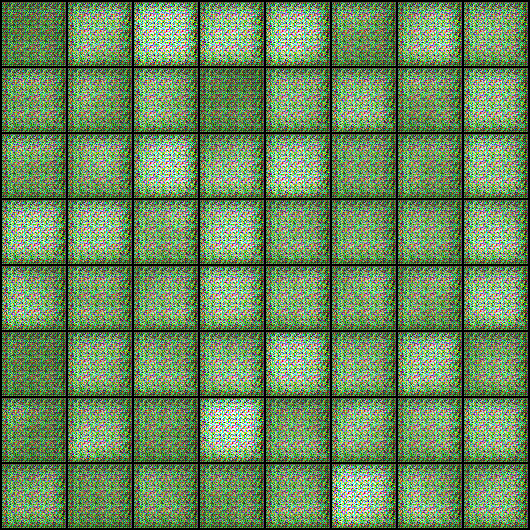

In [55]:
Image('./generated/generated-images-0001.png')

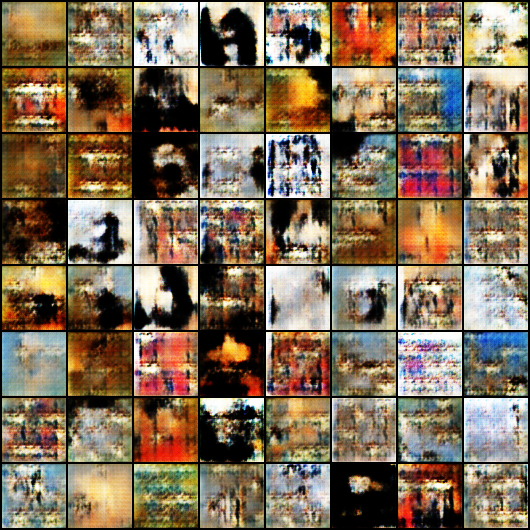

In [56]:
Image('./generated/generated-images-0031.png')

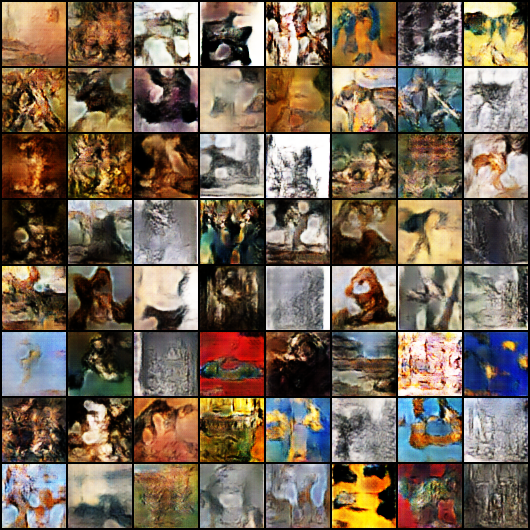

In [57]:
Image('./generated/generated-images-0090.png')

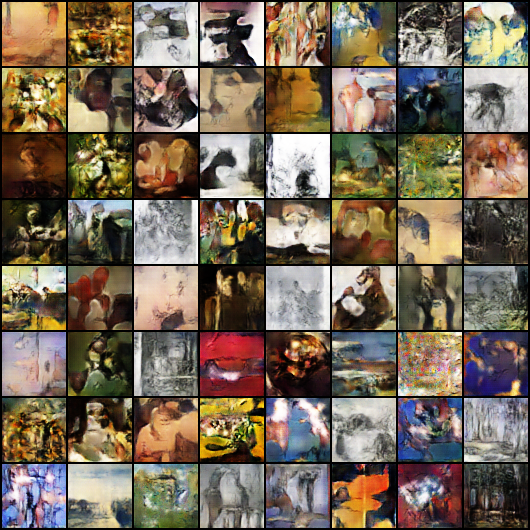

In [58]:
Image('./generated/generated-images-0141.png')

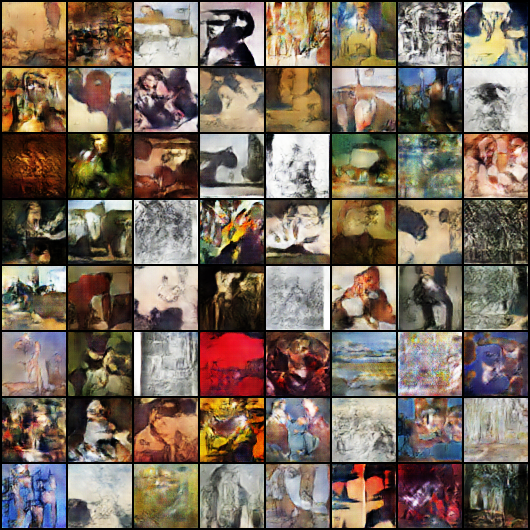

In [59]:
Image('./generated/generated-images-0201.png')

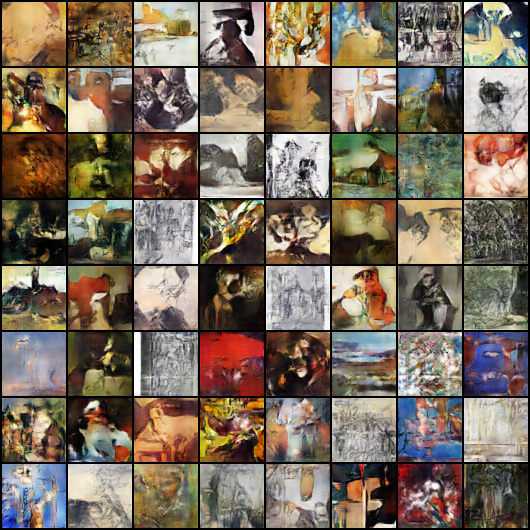

In [60]:
Image('./generated/generated-images-0241.png')

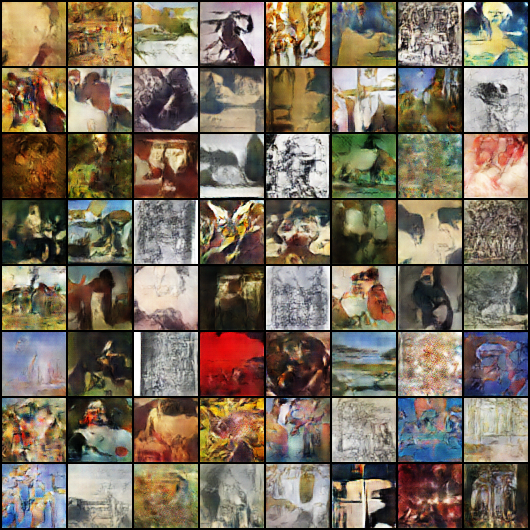

In [61]:
Image('./generated/generated-images-0281.png')

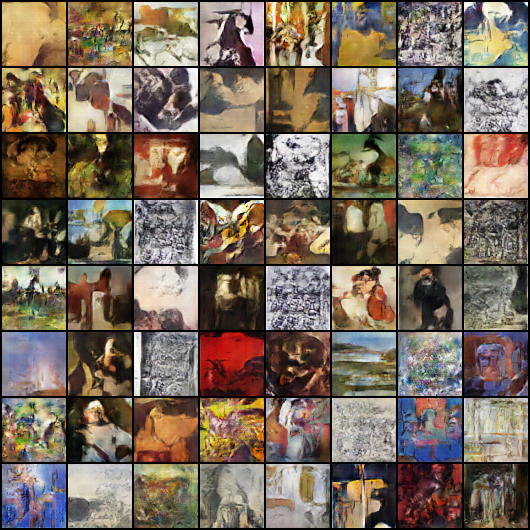

In [62]:
Image('./generated/generated-images-0300.png')

# Results

In [64]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

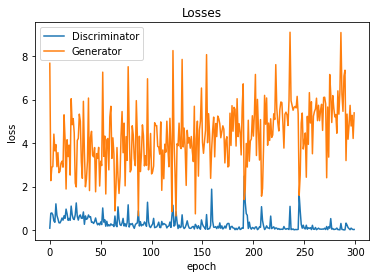

In [65]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

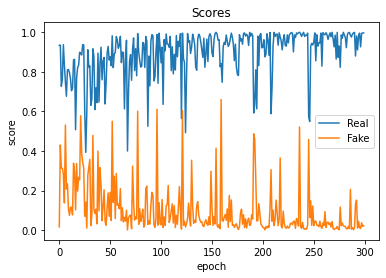

In [66]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

# Conclusion

Amateurs to professionals are gravitating towards GAN over its interesting approach and plausible results and the same was employed to generate visual creations inspired by the given dataset. 
 